(nn/01-intro)=
# Introduction

![Status](https://img.shields.io/static/v1.svg?label=Status&message=Finished&color=brightgreen)
[![Source](https://img.shields.io/static/v1.svg?label=GitHub&message=Source&color=181717&logo=GitHub)](https://github.com/particle1331/ok-transformer/blob/master/docs/nb/dl/01-intro.ipynb)
[![Stars](https://img.shields.io/github/stars/particle1331/ok-transformer?style=social)](https://github.com/particle1331/ok-transformer)

---

**Readings:** [[CS182-lec1]](https://cs182sp21.github.io/static/slides/lec-1.pdf) [[CS182-lec2]](https://cs182sp21.github.io/static/slides/lec-2.pdf) [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf) [[CS4780-lec12]](https://www.cs.cornell.edu/courses/cs4780/2018sp/lectures/lecturenote12.html)

## Introduction

The power of **deep learning** (DL) is that allows automatically learning **representations** from data.
This is evident in machine translation applications where phrases are not translated 1-1 between 
words in two languages ({numref}`01-thought`). Instead, an intermediate representation is learned between translated phrases.

```{figure} ../../img/nn/01-thought.png
---
name: 01-thought
width: 80%
---
Thought is a representation.
```

Recall that learning parameters of a parametric model that minimizes the task objective (e.g. prediction error). 
For our purposes, deep learning is machine learning with multiple layers of learned representations. Here a layer is any parametric transformation. Finally, any function with multiple layers of representation will be called a **neural network**. What makes DL work:
* big models, many layers
* large datasets containing many examples
* requires large compute (GPUs)

Is more layers better? Generally, yes ({numref}`01-imagenet-progress`). Higher level features are more abstract and invariant to noise which makes it easier to learn labels. 
This requires large models with many layers
This also requires large datasets with many examples of all different scenarios. This is necessary for complexity of distributions that it tries to learn. Both these requirements necessitate large compute ({numref}`01-gflops`).

```{figure} ../../img/nn/01-imagenet-progress.png
---
name: 01-imagenet-progress
width: 80%
---
Progress in top-5 error in the [ImageNet competition](https://en.wikipedia.org/wiki/ImageNet#ImageNet_Challenge).
```

```{figure} ../../img/nn/01-gflops.png
---
name: 01-gflops
width: 80%
---
ResNets are in the middle of the graph. GFlops are a good metric since a network can have large compute with small number of parameters (e.g. convolutions).
```

Since DL is so expensive, it is natural to ask whether it is a good idea.
The tradeoff is that DL models have very **high capacity** 
and are immediately **scalable** 
that as we add more layers, more data, and more compute, the 
models just get better and better. Moreover,
DL models acquire representations end-to-end purely from the data without requiring 
manual engineering of features or representations. 
Such representations are better tailored to the
current task and minimizes **inductive bias**. 
Indeed, DL has been able to beat several human
benchmark on specific tasks tasks {cite}`mnih2015human` {cite}`bert`.

**Remark.** Model capacity or complexity refers to how many 
different functions a  particular model class can represent. Roughly if model capacity is sufficiently large, its function space contains the true function that underlies the task. 
Note that model capacity
can be controlled by parameter count in practice, although more parameters does not necessarily imply a more complex model class: e.g. $f_{a, b}(x) = \sin((a + b) x)$ for $a, b \in \mathbb{R}.$
Inductive bias refers to built-in knowledge or biases in a model
designed to help it learned. All such
knowledge is "bias" in the sense that
it makes some solutions more likely
and some less likely. Scaling is the ability for an 
algorithm to work better as more data and model capacity is added.

## Universal Approximation

It turns out that **fully connected** neural networks can approximate any continuous function $f$ on a closed and bounded set $K \subset \mathbb{R}^d.$ This property is known as [universal approximation](https://en.wikipedia.org/wiki/Universal_approximation_theorem). In other words, if a continuous ground truth function $f$ underlying a task exists, then it can be approximated using a neural network on a compact set. Fully connected neural nets consist of **linear** or **dense layers** followed by a nonlinear function $\varphi$:

$$z_k = \varphi(\mathbf{x} \cdot \mathbf{w}_k + b_k)$$

This can be written as matrix multiplication: $\mathbf{z} = \varphi\left(\mathbf{x}\mathbf{W} + \mathbf{b}\right)$ if we write the input $\mathbf{x}$ with shape $(B, d)$ where $d$ is the number of features and $B$ is the number of instances that are processed in parallel. The following approximates a one-dimensional curve using a neural network with [ReLU activation](https://en.wikipedia.org/wiki/Rectifier_(neural_networks)):

In [1]:
import torch

# Ground truth
x = torch.linspace(-2*torch.pi, 2*torch.pi, 1000)
y = torch.sin(x) + 0.3 * x

# Get (sorted) sample
B = torch.randint(0, 1000, size=(24,))
B = torch.sort(B)[0]
xs = x[B]
ys = y[B]

# ReLU approximation
z = torch.zeros(1000,)
for i in range(len(xs) - 1):
    if torch.isclose(xs[i + 1], xs[i]):
        m = torch.tensor(0.0)
    else:
        M = (ys[i+1] - ys[i]) / (xs[i+1] - xs[i])
        s, m = torch.sign(M), torch.abs(M)
    z += s * (torch.relu(m * (x - xs[i])) - torch.relu(m * (x - xs[i+1])))
z += ys[0]

Note this only works (consistent with the theorem) for target function with domain `[a, b]`.

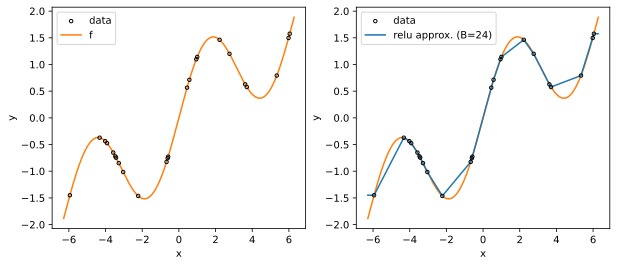

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib_inline import backend_inline
backend_inline.set_matplotlib_formats('svg')

# Plotting
fig, ax = plt.subplots(1, 2, figsize=(10, 4))
ax[0].scatter(xs, ys, facecolor='none', s=12, edgecolor='k', zorder=3, label='data')
ax[0].plot(x, y, color="C1", label='f')
ax[0].set_xlabel('x')
ax[0].set_ylabel('y')
ax[0].legend();

ax[1].scatter(xs, ys, facecolor='none', s=12, edgecolor='k', zorder=4, label='data')
ax[1].plot(x, z, color="C0", label=f'relu approx. (B={len(B)})', zorder=3)
ax[1].plot(x, y, color="C1")
ax[1].set_xlabel('x')
ax[1].set_ylabel('y')
ax[1].legend();

This works by constructing `___/‾‾‾` and `‾‾‾\___` functions similar to step functions but with slope in between adjacent points. The step functions increment each other starting with the constant function `ys[0]`. Note this correctly ends with a constant function `ys[-1]`.

## Linear classification

Neural networks learn separating hyperplanes after a sequence of transformations (layers) on the input data for classification tasks. The intermediate outputs of the layers are what we call representations. The distances of a data point to these hyperplanes are used as class scores or **logits**. Note that instead of labels, we want to predict probabilities since these can be perturbed. Note that we can apply any positive function $f$ to class scores to convert it to a probability vector:

$$p_j = \frac{f(s_j)}{\sum_k f(s_k)}.$$

A good choice for $f$ is the exponential function which maps $\mathbb R$ to $\mathbb R^+$ one-to-one. The resulting function is called the **softmax function**:

$$\text{softmax}(\mathbf{s})_j = p_j = \frac{e^{s_j}}{\sum_k e^{s_k}}.$$

**Remark.** Notice that for binary classification we recover the **sigmoid**: $p_1 = {1}/\left(1 + e^{-(s_1 - s_0)}\right)$. This is [logistic regression](https://en.wikipedia.org/wiki/Logistic_regression) if we are using a single layer neural network with $s_k = \mathbf{w}_k \cdot \mathbf{x}$ so that $s_1 - s_0 = (\mathbf{w}_1 - \mathbf{w}_0) \cdot \mathbf{x}$. Since we learn a weight vector for each class, there are generally as many separating hyperplanes as the number of classes. For binary classification with softmax, the two vectors subtract out resulting in one separating plane. Note that we supress the bias $b$ as this just shifts the hyperplane away from the origin.

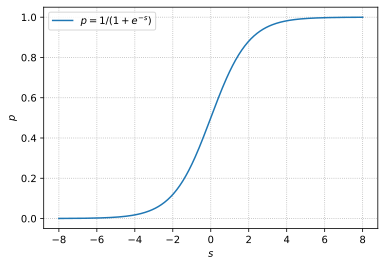

In [3]:
plt.figure(figsize=(6, 4))
s = np.linspace(-8, 8, 300)
p = 1 / (1 + np.exp(-s))

plt.plot(s, p, label="$p = 1 / (1 + e^{-s})$")
plt.xlabel("$s$")
plt.ylabel("$p$")
plt.legend()
plt.grid(linestyle="dotted");

Note that the sigmoid assigns $p =\frac{1}{2}$ at the hyperplane where $s = 0.$ It scales symmetrically with respect to the distance of the data points from the decision boundary. This is nice otherwise the prediction will not be invariant with respect to relabeling. For the general case of multiclass classification, we will have class scores $s_k = \mathbf{w}_k \cdot \mathbf{x}$ and the softmax will act like a voting function. See also [this video](https://www.youtube.com/watch?v=p-6wUOXaVqs) for deeper reasons on why the softmax works for neural networks.

In [4]:
w = np.array([1, 1])
b = 0

# Grid of points
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x, y)

# Effect of neural unit on input space
def sigmoid_unit(x, y):
    z = w[0] * x + w[1] * y + b
    return 1 / (1 + np.exp(-z))

Z = sigmoid_unit(X, Y)

Sigmoid unit assigns a gradient along the normal of the hyperplane defined by $\mathbf{w}$ and $b$ in the input space $\mathbb{R}^d$ (here $d = 2$).

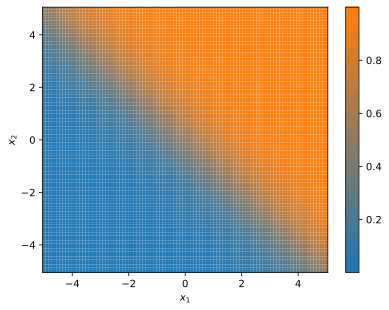

In [5]:
from matplotlib.colors import LinearSegmentedColormap

colors = ["C0", "C1"]
n_bins = 100
cm = LinearSegmentedColormap.from_list(name="", colors=colors, N=n_bins)

def plot_grid(X, Y, Z):
    plt.pcolormesh(X, Y, Z, shading='auto', cmap=cm)
    plt.colorbar()
    plt.xlabel('$x_1$')
    plt.ylabel('$x_2$')
    plt.show()

plot_grid(X, Y, Z)

ReLU unit has sharp cutoff at zero:

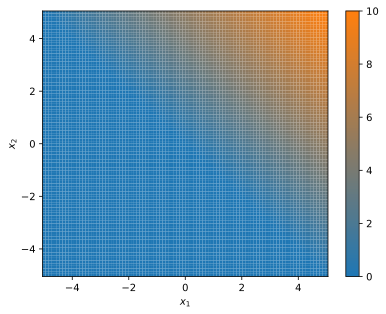

In [6]:
def relu_unit(x, y):
    z = w[0] * x + w[1] * y + b
    return np.maximum(0, z)

Z = relu_unit(X, Y)
plot_grid(X, Y, Z)

<br>

```{figure} ../../img/nn/01-sigmoid-1d.png
---
name: 01-sigmoid-1d
width: 80%
---
In the final layer, sigmoid assigns probabilities based on the distance from the hyperplane (i.e. collapsing the space onto 1-dimension). Source: [[CS182-lec2]](https://cs182sp21.github.io/static/slides/lec-2.pdf)
```

### Negative log loss (MLE)

The machine learning method follows four steps: defining a model, defining a loss function,
choosing an optimizer, and running it on large compute (e.g. GPUs). A **loss function** acts
a smooth surrogate to the true objective which may not be amenable to available optimization 
techniques. One approach called [maximum likelihood estimation](https://en.wikipedia.org/wiki/Maximum_likelihood_estimation#:~:text=In%20statistics%2C%20maximum%20likelihood%20estimation,observed%20data%20is%20most%20probable) (MLE) optimizes such that the dataset is more probable.
Given labeled [IID data](https://en.wikipedia.org/wiki/Independent_and_identically_distributed_random_variables) $\mathcal{D} = \{(\mathbf{x}_i, y_i)\}$, let

$$p(\mathcal{D}) = \prod_i p(y_i \mid \mathbf{x}_i)\; p(\mathbf{x}_i).$$

The term $p(y_i \mid \mathbf{x}_i)$ is the true probability which we
model with a parametric function $p_{\boldsymbol{\Theta}}(y_i \mid \mathbf{x}_i)$. Probabilities are
small numbers in $[0, 1]$ and we are multiplying lots of them. So we apply the logarithm which is monotonic
and converts the product into a sum:

$$
\begin{aligned}
\log p(\mathcal{D}) 
&= \sum_i \log p_{\boldsymbol{\Theta}}(y_i \mid \mathbf{x}_i) + \sum_i \log p(\mathbf{x}_i)
\end{aligned}
$$


Here $p_{\boldsymbol{\Theta}}(y_i \mid \mathbf{x}_i)$ is just shorthand for $p(y_i \mid \mathbf{x}_i, {\boldsymbol{\Theta}}).$ MLE maximizes this probability with respect to the parameters $\boldsymbol{\Theta}.$ Consistent with optimization literature, we convert this to a minimization problem. Note that the first sum is independent of the parameters. The following becomes our loss function:

$$\boldsymbol{\Theta}^* = \text{argmin}_{\boldsymbol{\Theta}} -\sum_i \log p_{\boldsymbol{\Theta}}(y_i \mid \mathbf{x}_i).$$

**Remark.** This can be written more generally as $\boldsymbol{\Theta}^* = \text{argmin}_{\boldsymbol{\Theta}} \mathbb{E}\left[\ell(\boldsymbol{\Theta})\right]$ where $\ell$ is the loss function. This is any nonnegative function whose value approaches zero whenever the prediction of the network the target value. Above $\log p_{\boldsymbol{\Theta}}(y_i \mid \mathbf{x}_i) \to 0$ as $p_{\boldsymbol{\Theta}}(y_i \mid \mathbf{x}_i) \to 1.$ Using an expectation over the underlying distribution is nice because the model focuses on errors based on its probability of occuring. We will approximate this with the **empirical risk** on the sample $\mathcal{D}$ defined as

$$\mathcal{L}_\mathcal{D}(\boldsymbol{\Theta}) = \frac{1}{|\mathcal{D}|} \sum_i \ell(y_i, f_{\boldsymbol{\Theta}}(\mathbf{x}_i)).$$

### Gradient descent

Training neural networks is essentially an optimization problem with the loss as objective. Given the current parameters $\boldsymbol{\Theta} \in \mathbb R^d$ of the network, we can imagine the network to be sitting on a point $(\boldsymbol{\Theta}, \mathcal L_{\mathcal{D}}(\boldsymbol{\Theta}))$ on a surface in $\mathbb R^d \times \mathbb R.$ The surface will generally vary for different samples of the training data, but we except the surfaces to be similar for large enough samples that are independently drawn from the same distribution. Training is equivalent to finding the minimum of this surface. 
Gradients arise in deep learning when making the following first-order approximation to surface increment:

$$\Delta \mathcal L \approx  \sum_k \left(\frac{\partial \mathcal L}{ \partial {\Theta}_k} \right)  \Delta {\Theta}_k = \left( \nabla_{\boldsymbol{\Theta}}\, \mathcal L \right) \cdot \Delta {\boldsymbol{\Theta}}.$$ 

It follows that $-\nabla_{\boldsymbol{\Theta}}\, \mathcal L$ is the direction of steepest descent at the current point $(\boldsymbol{\Theta}, \mathcal L)$ in the surface. **Gradient descent** (GD) is defined by the update rule: $\boldsymbol{\Theta} \leftarrow \boldsymbol{\Theta} - \eta \nabla_{\boldsymbol{\Theta}}\, \mathcal L$ where $\eta > 0.$ The positive constant $\eta$ controls the step size in GD and is called the **learning rate**. Note that finding good **initial weights** $\boldsymbol{\Theta}_0 \in \mathbb{R}^d$ is crucial since networks has lots of internal symmetries and can diverge in the early stages of training. Later on we will see that other optimization algorithms in deep learning practice are just modifications of GD.

In [7]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # For 3D plotting
import numpy as np

def plot_surface(ax, data, target, N=50):
    x = np.linspace(-5, 5, N)
    y = np.linspace(-5, 5, N)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)
    for i in range(N):
        for j in range(N):
            Z[i, j] = loss(np.array([X[i, j], Y[i, j]]), data, target)
    
    ax.plot_surface(X, Y, Z, cmap='Reds')
    ax.set_xlabel(f'$w_0$')
    ax.set_ylabel(f'$w_1$')
    ax.set_title('loss surface')
    

def plot_contourf(ax, data, target, w_min, w_hist, N=50):
    x = np.linspace(-5, 5, N)
    y = np.linspace(-5, 5, N)
    X, Y = np.meshgrid(x, y)
    Z = np.zeros_like(X)
    for i in range(N):
        for j in range(N):
            Z[i, j] = loss(np.array([X[i, j], Y[i, j]]), data, target)

    c = ax.contourf(X, Y, Z, levels=20, cmap='Reds')
    ax.scatter(w_min[0], w_min[1], color="red", label='min')
    ax.scatter(w_hist[:, 0], w_hist[:, 1], marker='o', s=1, facecolors='k')
    ax.set_title('gradient descent')
    ax.set_xlabel(f'$w_0$')
    ax.set_ylabel(f'$w_1$')
    plt.colorbar(c, ax=ax)

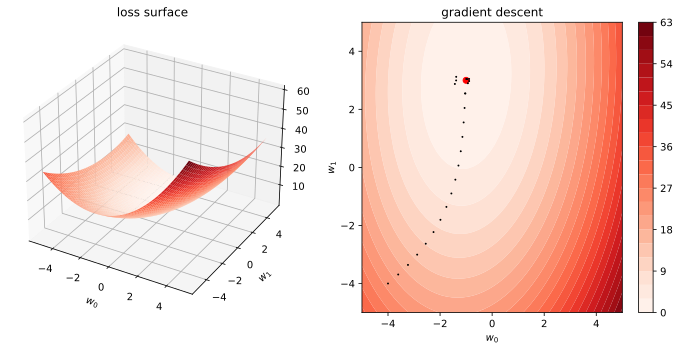

In [8]:
def loss(w, X, y):
    return ((X @ w - y)**2).mean()

def grad(w, X, y):
    """Gradient step for the MSE loss function"""
    dw = 2*((X @ w - y).reshape(-1, 1) * X).mean(axis=0)
    return dw / np.linalg.norm(dw)

def grad_descent(w0, X, y, eta=0.1, epochs=10):
    """Return sequence of weights from GD."""
    w = np.zeros([epochs, 2])
    w[0, :] = w0
    for j in range(1, epochs):
        u = w[j-1, :]
        w[j, :] = u - eta * grad(u, X, y)
    return w


# Generate data
n = 1000
X = np.zeros((n, 2))
X[:, 1] = np.random.uniform(low=-1, high=1, size=n)
X[:, 0] = 1
w_min = np.array([-1, 3])
y = (X @ w_min) + 0.05 * np.random.randn(n)  # data: y = -1 + 3x + noise

# Gradient descent
w_init = [-4, -4]
w_step = grad_descent(w_init, X, y, eta=0.5, epochs=25)

# Create a figure and two subplots
fig = plt.figure(figsize=(10, 5))
ax1 = fig.add_subplot(121, projection='3d')  # 3D subplot on the left
ax2 = fig.add_subplot(122)                   # contourf subplot on the right

# Call the functions with the respective axes
plot_surface(ax1, X, y)
plot_contourf(ax2, X, y, w_min, w_step)
plt.tight_layout()
plt.show()

**Figure.** Loss surface (left) and gradient descent (right) of a linear function with MSE loss.

### Nonlinear decision boundary

Going back to classification. Let us generate data that is **not** linearly separable. It turns out that linear classification can be extended to data that is not linearly separable.

In [9]:
import torch 
torch.manual_seed(0)

N = 600 # sample size
noise = lambda e: torch.randn(N, 2) * e
t = 2 * torch.pi * torch.rand(N, 1)
x1 = torch.cat([1.0 * torch.cos(t), 1.0 * torch.sin(t)], dim=1) + noise(0.1)
x0 = torch.cat([0.1 * torch.cos(t), 0.1 * torch.sin(t)], dim=1) + noise(0.05)
y1 = (torch.ones(N,) * 1).long()
y0 = (torch.ones(N,) * 0).long()

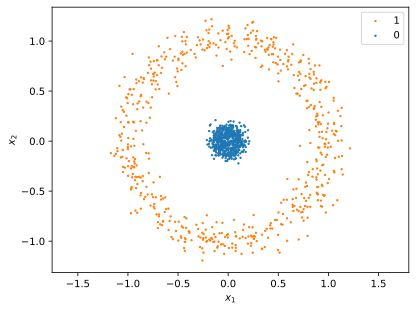

In [10]:
plt.scatter(x1[:, 0], x1[:, 1], s=2.0, label=1, color="C1")
plt.scatter(x0[:, 0], x0[:, 1], s=2.0, label=0, color="C0")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")
plt.legend()
plt.axis('equal');

Modeling this with a fully-connected neural network with layers containing 2-6-2 units. The hidden units have ReLU activation which simply maps $x \mapsto \max(0, x)$. As shown above, each unit separates its input space along the normal of the hyperplane defined by its weight $\mathbf{w}$ and bias $b$. For the ReLU this gradient is sharp at the boundary, zero in the opposite side and lineary increasing along the direction of the weight vector $\mathbf{w}.$ This is the immediate representation which gets passed to the next layer. 

In [11]:
import torch.nn as nn
from torchsummary import summary

model = lambda: nn.Sequential(
    nn.Linear(2, 6), 
    nn.ReLU(),
    nn.Linear(6, 2)
)

summary(model(), input_size=(2,))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                    [-1, 6]              18
              ReLU-2                    [-1, 6]               0
            Linear-3                    [-1, 2]              14
Total params: 32
Trainable params: 32
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.00
Forward/backward pass size (MB): 0.00
Params size (MB): 0.00
Estimated Total Size (MB): 0.00
----------------------------------------------------------------


Gradient descent on the [cross-entropy loss](https://en.wikipedia.org/wiki/Cross-entropy) (equivalent to NLL):

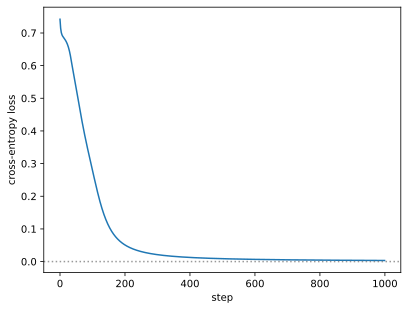

In [12]:
import torch.nn.functional as F

net = model()
loss_fn = lambda logits, y: F.cross_entropy(logits, y)
optim = torch.optim.SGD(net.parameters(), lr=0.3)

x = torch.cat([x0, x1])
y = torch.cat([y0, y1])
history = []
for step in range(1000):
    logits = net(x)
    loss = loss_fn(logits, y)
    loss.backward()
    optim.step()
    optim.zero_grad()
    history.append(loss.item())
    
plt.plot(history)
plt.axhline(0.0, linestyle="dotted", color="grey", alpha=0.8)
plt.xlabel("step")
plt.ylabel("cross-entropy loss");

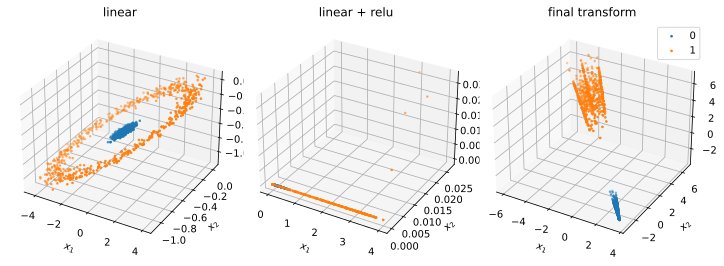

In [13]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# transformations
x0_3d = net[0](x0).detach().numpy()
x1_3d = net[0](x1).detach().numpy()
x0_3d_relu = net[1](net[0](x0)).detach().numpy()
x1_3d_relu = net[1](net[0](x1)).detach().numpy()
x0_final = net(x0).detach().numpy()
x1_final = net(x1).detach().numpy()

# plot
fig, ax = plt.subplots(ncols=3, figsize=(10, 16), subplot_kw={'projection': '3d'})
ax[0].scatter(x0_3d[:, 0], x0_3d[:, 1], x0_3d[:, 1], s=3, label=0, color="C0")
ax[0].scatter(x1_3d[:, 0], x1_3d[:, 1], x1_3d[:, 1], s=3, label=1, color="C1")
ax[0].set_xlabel('$x_1$')
ax[0].set_ylabel('$x_2$')
ax[0].set_title('linear')

ax[1].scatter(x0_3d_relu[:, 0], x0_3d_relu[:, 1], x0_3d_relu[:, 1], s=3, label=0, color="C0")
ax[1].scatter(x1_3d_relu[:, 0], x1_3d_relu[:, 1], x1_3d_relu[:, 1], s=3, label=1, color="C1")
ax[1].set_xlabel('$x_1$')
ax[1].set_ylabel('$x_2$')
ax[1].set_title('linear + relu')

ax[2].scatter(x0_final[:, 0], x0_final[:, 1], x0_final[:, 1], s=3, label=0, color="C0")
ax[2].scatter(x1_final[:, 0], x1_final[:, 1], x1_final[:, 1], s=3, label=1, color="C1")
ax[2].set_xlabel('$x_1$')
ax[2].set_ylabel('$x_2$')
ax[2].set_title('final transform')

fig.tight_layout()
plt.legend()
plt.show()

Seems linearly separable. Checking classification accuracy:

In [14]:
a = (torch.argmax(net(x0), dim=1) == y0).float().mean().item()
b = (torch.argmax(net(x1), dim=1) == y1).float().mean().item()
a, b

(1.0, 1.0)

Plotting the decision surface on the input space. Note that we have to convert logits to probabilities:

In [15]:
def prediction(x, y):
    p = F.softmax(net(torch.tensor([[x, y]])), dim=1)
    return p[0, 1].item()

In [16]:
from matplotlib.colors import LinearSegmentedColormap

# Define your custom colormap
colors = ["C0", "C1"]
n_bins = 100
cm = LinearSegmentedColormap.from_list(name="", colors=colors, N=n_bins)

# Create a grid of points
N = 100
x = np.linspace(-1.5, 1.5, N)
y = np.linspace(-1.5, 1.5, N)
X, Y = np.meshgrid(x, y)

# Calculate function values for each point on the grid
Z = np.zeros_like(X)
for i in range(N):
    for j in range(N):
        Z[i, j] = prediction(float(X[i, j]), float(Y[i, j]))

# Create a color plot using the custom colormap
plt.pcolormesh(X, Y, Z, shading='auto', cmap=cm)
plt.colorbar()
plt.xlabel('X')
plt.ylabel('Y')

plt.scatter(x1[:, 0], x1[:, 1], s=10.0, label=1, color="C1", edgecolor="black")
plt.scatter(x0[:, 0], x0[:, 1], s=10.0, label=0, color="C0", edgecolor="black")
plt.xlabel("$x_1$")
plt.ylabel("$x_2$")
plt.legend()
plt.axis('equal');

plt.xlim(-1.5, 1.5)
plt.ylim(-1.5, 1.5)
plt.show();

**Figure.** Probability assigned by the trained network on the input space. Note that we were able to extend linear classification to learning a nonlinear decision boundary. Notice the sharpness in the boundary which is an artifact of using ReLU. This can be thought of as a manifestation of inductive bias.

## Empirical Risk Minimization (ERM)

Recall we defined **empirical risk** as $\mathcal{L}_\mathcal{D}(\boldsymbol{\Theta}) = \frac{1}{|\mathcal{D}|} \sum_i \ell(y_i, f_{\boldsymbol{\Theta}}(\mathbf{x}_i)).$ It is natural to ask whether this approximates the **true risk** $\mathbb{E}[\ell(y, f(\mathbf{x}))]$ where $f$ is the true function underlying the process. There are two things to watch out for when training neural networks:

* **Overfitting.** This occurs when the empirical risk is low but the true risk is high. This can happen if the dataset is too small and not representative of the true distribution. Or if the model is too powerful. Having too high capacity will interpolate the sample, but will have arbitrary behavior between datapoints.

+++

* **Underfitting.** Here both empirical risk and true risk are high. This can happen if the model is too weak (low capacity, or too few parameters). Or if the optimizer is not configured well (e.g. wrong learning rate).

<br>

Observe that MLE is by definition prone to overfitting. We rely on smoothness between data points for the model to generalize to test data. It is important to analyze the error between different **training sets**. A well-trained model should not look too different between samples. See {numref}`01-overfitting-underfitting`. But we also don't want it to have the same errors with different data!

<br>

```{figure} ../../img/nn/01-overfitting-underfitting.png
---
name: 01-overfitting-underfitting
width: 100%
---
Drawing of a model that overfits and underfits the distribution. Source: [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf)
```

### Bias-variance tradeoff

Let us analyze the squared error of trained models. See [these notes](https://www.cs.cornell.edu/courses/cs4780/2018sp/lectures/lecturenote12.html) for a more careful treatment. Let $f_{\mathcal{D}}$ be the function obtained by training over the sample $\mathcal{D}$ and let $\bar{f}$ be the expected function when drawing fixed sized samples $\mathcal{D} \stackrel{\text{iid}}{\sim} P^n$ where $n = |\mathcal{D}|$ and $P$ is the underlying data distribution. In other words, $\bar{f}$ is an ensemble of trained models weighted by the probability of its training dataset. Then:

$$
\begin{aligned}
\mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[ \left(f_{\mathcal{D}}(\mathbf{x}) - f(\mathbf{x}) \right)^2 \right]
&= \mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[ \left((f_{\mathcal{D}}(\mathbf{x}) - \bar{f}(\mathbf{x})) + (\bar{f}(\mathbf{x}) - f(\mathbf{x})) \right)^2 \right] \\
&= \mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[ (f_{\mathcal{D}}(\mathbf{x}) - \bar{f}(\mathbf{x}))^2 \right] 
+ 2\, \mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[(f_{\mathcal{D}}(\mathbf{x}) - f(\mathbf{x}))(\bar{f}(\mathbf{x}) - f(\mathbf{x})) \right] + \mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[(\bar{f}(\mathbf{x}) - f(\mathbf{x}))^2 \right] \\
&= \mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[ (f_{\mathcal{D}}(\mathbf{x}) - \bar{f}(\mathbf{x}))^2 \right] 
+ 0 + \mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[(\bar{f}(\mathbf{x}) - f(\mathbf{x}))^2 \right] \\
&= \underbrace{\mathbb{E}_{\mathbf{x}, \mathcal{D}}\left[ (f_{\mathcal{D}}(\mathbf{x}) - \bar{f}(\mathbf{x}))^2 \right]}_{\text{Variance}} 
 + \underbrace{\mathbb{E}_{\mathbf{x}}\left[(\bar{f}(\mathbf{x}) - f(\mathbf{x}))^2 \right]}_{\text{Bias}^2}. \\
\end{aligned} \\
$$

The middle term vanishes by writing it as: 

$$
\mathbb{E}_{\mathbf{x}} \left[\underbrace{\mathbb{E}_{\mathcal{D}}\left[(f_{\mathcal{D}}(\mathbf{x}) - f(\mathbf{x}))\right]}_{0} \; (\bar{f}(\mathbf{x}) - f(\mathbf{x}))  \right] = 0.
$$

Observe that the **variance** term describes sample dependent errors with respect to the ensemble function. It measures deviation between training without actually looking into the true function. The **bias** term, on the other hand, looks at the error of the ensemble $\bar{f}$ from the true function $f.$ These can be visualized as manifesting in the left and right plots respectively of {numref}`01-overfitting-underfitting`.

**Classical tradeoff.** There is a tradeoff with respect to model complexity for fixed $n.$ If we increase model complexity, these models will have higher variance but lower bias. Overfitting occurs when a model is too complex that it captures noise in the dataset. On the other hand, simpler models underfits with high bias, since they tend to saturate to the same function. 
Note that using larger $n$ can decrease variance as more data will result in drowning out noise, and are insensitive to noise. But bias does not go away no matter how much data we have! Hence, it is nicer to have more complex models whose complexity we later control (see next section).

**Double descent.** Moreover, there is the phenomenon of **double descent** {cite}`double-descent` observed in most networks used in practice where both bias and variance go down with excess complexity. See [this interview](https://www.youtube.com/watch?v=W_TAKJRgrbs) by one of the authors. One intuition is that near the **interpolation threshold** where there is roughly a 1-1 correspondence between all the sample datasets and the models, small changes in the dataset lead to large changes in the model. This is the **critical regime** in the classical case where overfitting occurs. Having more data destroys this 1-1 correspondence, which is covered by the classical tradeoff described above. 

Double descent occurs in the opposite case where we have much more parameters than data ({numref}`01-double-descent`). SGD gets to focus more on what it wants to do, i.e. search for flat minima, since it is not constrained to use the full model capacity. Models around flat minimas {cite}`flat-minima` errors that are more stable to perturbation in the weights and are precisely those that are smooth between data points. Such models have been known to generalize well {cite}`hochreiter1997flat`.

<br>

```{figure} ../../img/nn/01-double-descent.png
---
name: 01-double-descent
width: 80%
---
Double descent for ResNet18. The width parameter controls model complexity. Source: {cite}`double-descent`
```

<br>

```{figure} ../../img/nn/01-double-descent-data.png
---
name: 01-double-descent-data
width: 90%
---
Additional data increases model variance within the critical regime.
More data shifts the interpolation threshold to the right, resulting in
worse test performance compared to the same model trained on a smaller sample. 
Increasing model complexity improves test performance.
Source: {cite}`double-descent`
```

<br>

```{figure} ../../img/nn/01-double-descent-epochs.png
---
name: 01-double-descent-epochs
width: 100%
---
Larger models require more training, so larger epochs is required for double descent to occur. Source: {cite}`double-descent`
```

### Regularization

How do we regulate bias and variance? There are two solutions: (1) getting **more data**, (2) increasing **model complexity**. More data decreases variance but has no effect on bias, since low complexity models are saturated. Increasing complexity decreases bias but increases variance. A better approach is to control model complexity until we get a good tradeoff. This approach is called **regularization**. Regularization can be thought of as a continuous knob on complexity that smoothly restricts model class.

<br>

```{figure} ../../img/nn/01-high-variance.png
---
name: 01-high-variance
width: 90%
---
All these have zero training error. But the third one is better. This is because resampling will result in higher empirical risk for the first two, which implies high true risk. Source: [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf)
```

**Other perspectives.** Before our deep dive into L1 and L2 regularization, we discuss other approaches. The numerical perspective is that adding a regularization term in the loss can make underdetermined problems well-determined. The optimization perspective is that the regularizer makes the loss landscape easier to search.
Paradoxically, regularizers can sometimes reduce underfitting if it was due to poor optimization!
Note that regularizers introduce hyperparameters that we have to
select in order for them to work well. Other types of regularizers are ensembling (e.g. [dropout](https://machinelearningmastery.com/dropout-for-regularizing-deep-neural-networks/)) and [gradient penalty](https://towardsdatascience.com/demystified-wasserstein-gan-with-gradient-penalty-ba5e9b905ead) (for GANs).

**Bayesian perspective.** High variance occurs when data does not give enough information to identify parameters. We can look into other parts of the training pipeline where we can provide more information. In particular, we use the loss function. If we provide enough information to disambiguate between (almost) equally good models, we can pick the best one. Defining regularization as something we add to the loss function can be interpreted in a Bayesian perspective as a **prior** on the parameters:

$$
\begin{aligned}
p(\boldsymbol{\Theta} \mid \mathcal{D}) &\propto p(\boldsymbol{\Theta}) \; p(\mathcal{D} \mid \boldsymbol{\Theta}) \\
&= p(\boldsymbol{\Theta}) \prod_i p(y_i \mid \mathbf{x}_i, {\boldsymbol{\Theta}}) \; p(\mathbf{x}_i) \\
\end{aligned}.
$$

This results in the loss: 

$$
\mathcal{L}(\boldsymbol{\Theta}) = - \left (\sum_i \log p_{\boldsymbol{\Theta}}(y_i \mid \mathbf{x}_i) \right) - {\log p(\boldsymbol{\Theta})}.
$$

Can we pick a prior that makes the smoother function more likely?
We want to assign a distribution on the parameters $\boldsymbol{\Theta}$ that assigns higher probabilities to **small** numbers: e.g. $p(\boldsymbol{\Theta}) \sim \mathcal{N}(0, \sigma^2\mathbf{I}).$ This may result
in a smoother fit ({numref}`01-high-variance`c). Solving the prior:

$$
\begin{aligned}
\log p(\boldsymbol{\Theta}) 
&= \sum_{j} \left(-\frac{1}{2\sigma^2} {\theta_j}^2  - \log \sigma - \frac{1}{2} \log 2 \pi \right) \\
&= - \lambda \lVert \boldsymbol{\Theta} \rVert^2 + \text{const.} \\
\end{aligned}
$$

where $\lambda > 0$  and $\lVert \cdot \rVert_2$ is the L2 norm. 
Since we choose the prior, $\lambda$ effectively becomes a training **hyperparameter**.
This controls the strength of regularization. The resulting loss has the **L2 regularization** term:  


$$
\mathcal{L}(\boldsymbol{\Theta}) = - \sum_i \log p_{\boldsymbol{\Theta}}(y_i \mid \mathbf{x}_i) - \lambda \lVert \boldsymbol{\Theta} \rVert^2.
$$

The same analysis with a [Laplace prior](https://en.wikipedia.org/wiki/Laplace_distribution) results in the **L1 regularization** term: 

$$- \lambda \lVert \boldsymbol{\Theta} \rVert_1 = -\lambda \sum_j |\theta_j|.$$

**Remark.** For classification tasks, larger weights result in sharper probabilities, so we can apply the same analysis.

<br>

```{figure} ../../img/nn/01-regularization-contour.png
---
name: 01-regularization-contour
width: 80%
---
Minimizing both prediction loss and regularization loss surfaces. L1
results in sparse weights since moving along the axes results in minimal increase in the prediction loss
with maximal decrease in regularization loss.
Source: [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf)
```

In [17]:
import warnings
from sklearn.linear_model import Ridge, Lasso
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
warnings.simplefilter("ignore")

# data
x = np.linspace(-2*np.pi, 2*np.pi, 1000)
y = np.sin(x) + 0.3 * x

def model(degree, sample_size, alpha=0.0):
    B = torch.randint(0, 1000, size=(sample_size,))
    B = torch.sort(B)[0]
    xs = x[B]
    ys = y[B]

    poly = PolynomialFeatures(degree=degree)
    ridge_model = make_pipeline(poly, Ridge(alpha=alpha))
    ridge_model.fit(xs.reshape(-1, 1), ys.reshape(-1, 1))
    return ridge_model.predict(x.reshape(-1, 1)).reshape(-1)

Error ($\varepsilon$) is average RMSE on the middle portion. Decreasing model complexity decreases variance:

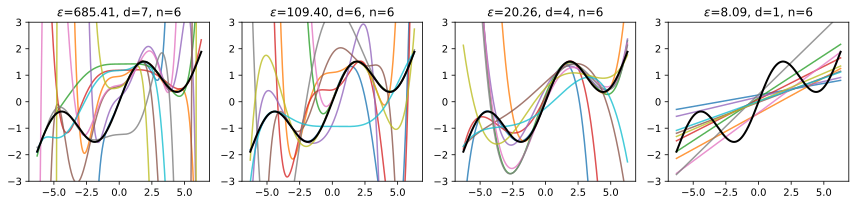

In [18]:
def plot_model(ax, degree=6, sample_size=6, alpha=0.0, count=10):
    models = []
    error = 0
    for i in range(10):
        p = model(degree, sample_size, alpha)
        ax.plot(x, p, alpha=0.8)
        models.append(p)
        error += (((y[100:-100] - p[100:-100]) ** 2).mean()) ** 0.5
    
    title = f"$\epsilon$={error:.2f}, d={degree}, n={sample_size}"
    if alpha > 0:
        title += f", $\lambda$={alpha}"
    
    ax.set_title(title)
    ax.plot(x, y, color="black", linewidth=2)
    ax.set_ylim(-3, 3)
    
    return error / count


fig, ax = plt.subplots(1, 4, figsize=(12, 3))
plot_model(ax[0], degree=7, sample_size=6)
plot_model(ax[1], degree=6, sample_size=6)
plot_model(ax[2], degree=4, sample_size=6)
plot_model(ax[3], degree=1, sample_size=6)
fig.tight_layout()

More data decreases variance and we can see better the effect of bias on the tradeoff:

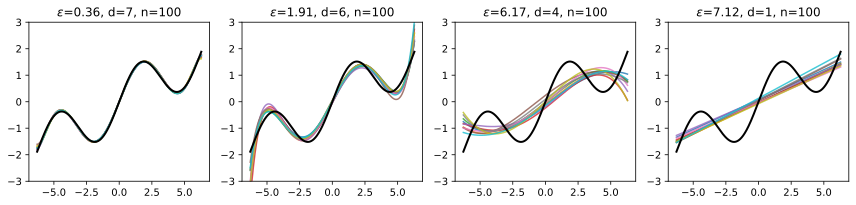

In [19]:
fig, ax = plt.subplots(1, 4, figsize=(12, 3))
plot_model(ax[0], degree=7, sample_size=100)
plot_model(ax[1], degree=6, sample_size=100)
plot_model(ax[2], degree=4, sample_size=100)
plot_model(ax[3], degree=1, sample_size=100)
fig.tight_layout()

Increasing regularization strength decreases variance:

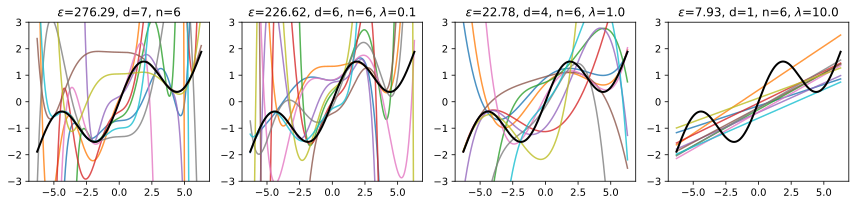

In [20]:
fig, ax = plt.subplots(1, 4, figsize=(12, 3))
plot_model(ax[0], degree=7, sample_size=6, alpha=0.0)
plot_model(ax[1], degree=6, sample_size=6, alpha=0.1)
plot_model(ax[2], degree=4, sample_size=6, alpha=1.0)
plot_model(ax[3], degree=1, sample_size=6, alpha=10.0)
fig.tight_layout()

### Dataset split

How do we know if we are overfitting or underfitting? Note that we do not have access to the
ground truth function $f$ (otherwise there is no point in doing ML) or the expected model
$\bar{f}$ (too expensive to estimate). How do we select algorithm or hyperparameters? 
This
can be done simply by reserving a subset of the dataset called the **validation set** for
estimating the true risk. The validation performance is used for choosing hyperparameters and tweaking the model class. Recall that the training dataset is used to minimize the empirical risk.

* Overfitting is characterized by significant $\mathcal{L}_{\mathcal{D}_{\text{train}}}(\boldsymbol{\Theta}) \gg \mathcal{L}_{\mathcal{D}_{\text{val}}}(\boldsymbol{\Theta})$. Increase regularization. 
* Underfitting is characterized by $\mathcal{L}_{\mathcal{D}_{\text{train}}}(\boldsymbol{\Theta})$ not decreasing low enough ({numref}`01-train-valid-curve`). Increase complexity, decrease regularization, or improve the optimizer (e.g. learning rate, batch size for SGD variants).

Finally, another separate **test set** is used to report the final performance. The loss 
on the test set acts as an estimate of the true risk of the trained model. Note that the training, validation, and test sets are disjoint.

<br>

```{figure} ../../img/nn/01-train-valid-curve.png
---
name: 01-train-valid-curve
width: 70%
---
Train and validation loss curves during training.
Source: [[CS182-lec3]](https://cs182sp21.github.io/static/slides/lec-3.pdf)
```

▤